In [141]:
import pandas as pd
import seaborn as sns
import os
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import numpy as np

In [142]:
df = pd.read_csv('CSV/data_term_7_43.csv')

In [143]:
df

,Unnamed: 0,frame_number,spatters_count_del,thermogram_id,spatters_above_threshold,spatters_median_temperature,spatters_mean_temperature,spatters_max_temperature,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold,welding_zone_detected,welding_zone_mean_temperature,welding_zone_max_temperature,welding_zone_size,test_zone,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area
0,0,1,0,7,0,NaN,NaN,NaN,0,0.0,False,NaN,NaN,0,NaN,0,0,0,0.0,0.0
1,1,2,0,7,0,NaN,NaN,NaN,0,0.0,False,NaN,NaN,0,NaN,0,0,0,0.0,0.0
2,2,3,0,7,0,NaN,NaN,NaN,0,0.0,False,NaN,NaN,0,NaN,0,0,0,0.0,0.0
3,3,4,0,7,0,NaN,NaN,NaN,0,0.0,False,NaN,NaN,0,NaN,0,0,0,0.0,0.0
4,4,5,0,7,0,NaN,NaN,NaN,0,0.0,False,NaN,NaN,0,NaN,0,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63225,63225,2996,0,43,0,NaN,NaN,NaN,0,0.0,True,NaN,NaN,0,NaN,0,0,0,0.0,0.0
63226,63226,2997,0,43,0,NaN,NaN,NaN,0,0.0,True,NaN,NaN,0,NaN,0,0,0,0.0,0.0
63227,63227,2998,0,43,0,NaN,NaN,NaN,0,0.0,True,NaN,NaN,0,NaN,0,0,0,0.0,0.0
63228,63228,2999,0,43,0,NaN,NaN,NaN,0,0.0,True,NaN,NaN,0,NaN,0,0,0,0.0,0.0


In [144]:
df = df.drop(columns=['Unnamed: 0', 'spatters_count_del'])

In [145]:
df.columns

Index(['frame_number', 'thermogram_id', 'spatters_above_threshold',
       'spatters_median_temperature', 'spatters_mean_temperature',
       'spatters_max_temperature', 'spatters_total_pixels_above_threshold',
       'spatters_percentage_above_threshold', 'welding_zone_detected',
       'welding_zone_mean_temperature', 'welding_zone_max_temperature',
       'welding_zone_size', 'test_zone', 'spatters_total', 'spatters_new',
       'spatters_lost', 'spatters_mean_velocity', 'spatters_mean_area'],
      dtype='object')

In [146]:
# Создаем новый порядок столбцов вручную
new_order = [
    'thermogram_id', 'frame_number', 'test_zone',
    'welding_zone_detected', 'welding_zone_size',
    'welding_zone_mean_temperature', 'welding_zone_max_temperature',
     'spatters_total',
    'spatters_new', 'spatters_lost',
    'spatters_mean_velocity', 'spatters_mean_area',
    'spatters_mean_temperature', 'spatters_median_temperature',
    'spatters_max_temperature', 'spatters_above_threshold',
    'spatters_total_pixels_above_threshold',
    'spatters_percentage_above_threshold'
]

df = df[new_order]

In [147]:
df

,thermogram_id,frame_number,test_zone,welding_zone_detected,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area,spatters_mean_temperature,spatters_median_temperature,spatters_max_temperature,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold
0,7,1,NaN,False,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
1,7,2,NaN,False,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
2,7,3,NaN,False,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
3,7,4,NaN,False,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
4,7,5,NaN,False,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63225,43,2996,NaN,True,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
63226,43,2997,NaN,True,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
63227,43,2998,NaN,True,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0
63228,43,2999,NaN,True,0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,0,0,0.0


In [148]:
df = df.dropna(subset=['test_zone'])

In [149]:
df

,thermogram_id,frame_number,test_zone,welding_zone_detected,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area,spatters_mean_temperature,spatters_median_temperature,spatters_max_temperature,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold
27,7,28,A,True,17,1906.588235,3778.0,23,0,0,1.598014,30.767448,425.526316,425.526316,425.526316,1,19,8.444444
28,7,29,A,True,16,1536.125000,2482.0,21,0,2,1.728313,31.207838,429.800000,429.800000,429.800000,1,35,11.513158
29,7,30,A,True,14,1655.000000,3064.0,15,0,5,2.155489,23.087148,NaN,NaN,NaN,0,0,0.000000
30,7,31,A,True,23,1447.173913,3222.0,2,1,14,0.666473,138.672297,427.783333,427.783333,428.000000,2,31,9.872611
31,7,32,A,True,23,1551.652174,3600.0,3,2,0,0.000000,96.614379,485.859649,485.859649,540.666667,2,41,13.355049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62292,43,2063,D,True,16,1031.437500,1067.0,1,1,0,0.000000,20.000000,494.000000,494.000000,494.000000,1,25,100.000000
62293,43,2064,D,True,14,1032.285714,1059.0,1,0,0,0.700106,20.009708,489.520000,489.520000,489.520000,1,25,100.000000
62294,43,2065,D,True,14,1027.642857,1056.0,1,0,0,0.050602,14.674313,491.200000,491.200000,491.200000,1,15,100.000000
62295,43,2066,D,True,13,1024.615385,1052.0,0,0,0,0.000000,0.000000,NaN,NaN,NaN,0,0,0.000000


In [150]:
counts = df['welding_zone_detected'].value_counts(dropna=False)
print(counts)

welding_zone_detected
True    46860
Name: count, dtype: int64


In [151]:
df = df.drop(columns=['welding_zone_detected'])

In [152]:
df

,thermogram_id,frame_number,test_zone,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area,spatters_mean_temperature,spatters_median_temperature,spatters_max_temperature,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold
27,7,28,A,17,1906.588235,3778.0,23,0,0,1.598014,30.767448,425.526316,425.526316,425.526316,1,19,8.444444
28,7,29,A,16,1536.125000,2482.0,21,0,2,1.728313,31.207838,429.800000,429.800000,429.800000,1,35,11.513158
29,7,30,A,14,1655.000000,3064.0,15,0,5,2.155489,23.087148,NaN,NaN,NaN,0,0,0.000000
30,7,31,A,23,1447.173913,3222.0,2,1,14,0.666473,138.672297,427.783333,427.783333,428.000000,2,31,9.872611
31,7,32,A,23,1551.652174,3600.0,3,2,0,0.000000,96.614379,485.859649,485.859649,540.666667,2,41,13.355049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62292,43,2063,D,16,1031.437500,1067.0,1,1,0,0.000000,20.000000,494.000000,494.000000,494.000000,1,25,100.000000
62293,43,2064,D,14,1032.285714,1059.0,1,0,0,0.700106,20.009708,489.520000,489.520000,489.520000,1,25,100.000000
62294,43,2065,D,14,1027.642857,1056.0,1,0,0,0.050602,14.674313,491.200000,491.200000,491.200000,1,15,100.000000
62295,43,2066,D,13,1024.615385,1052.0,0,0,0,0.000000,0.000000,NaN,NaN,NaN,0,0,0.000000


In [153]:
target_df = pd.read_excel('CSV/metky.xlsx')

In [154]:
# Способ 1: Словарем (наиболее читаемый)
target_df = target_df.rename(columns={
    'Unnamed: 0': 'term_id',
    'Unnamed: 1': 'test_zone'
})

target_df

,term_id,test_zone,hu,hg,he,hp,hs,hm,hi
0,1,a,1,1,1,1,2,1,1
1,1,b,1,1,1,1,1,1,1
2,1,c,1,1,1,1,1,1,1
3,1,d,1,4,1,1,3,1,1
4,2,a,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
167,42,d,1,1,1,1,1,1,1
168,43,a,1,1,1,1,1,1,1
169,43,b,1,1,1,1,1,1,1
170,43,c,1,1,1,1,2,1,1


In [155]:

df_prep = df.copy()
target_prep = target_df.copy()

# Нормализуем test_zone (приводим к верхнему регистру и удаляем пробелы)
df_prep['test_zone_norm'] = df_prep['test_zone'].astype(str).str.upper().str.strip()
target_prep['test_zone_norm'] = target_prep['test_zone'].astype(str).str.upper().str.strip()

# Приводим ID к одному типу
df_prep['thermogram_id'] = df_prep['thermogram_id'].astype(str)
target_prep['term_id'] = target_prep['term_id'].astype(str)

# Шаг 2: Выполняем merge
df_enriched = pd.merge(
    df_prep,
    target_prep.rename(columns={'term_id': 'thermogram_id'}),
    left_on=['thermogram_id', 'test_zone_norm'],
    right_on=['thermogram_id', 'test_zone_norm'],
    how='left'
)

# Шаг 3: Переносим значения из target_df
target_cols = ['hu', 'hg', 'he', 'hp', 'hs', 'hm', 'hi']

# Если в df уже есть эти столбцы, удаляем старые версии
for col in target_cols:
    if f'{col}_x' in df_enriched.columns and f'{col}_y' in df_enriched.columns:
        # Берем значения из target_df (y), если они не NaN
        df_enriched[col] = df_enriched[f'{col}_y'].combine_first(df_enriched[f'{col}_x'])
        df_enriched = df_enriched.drop(columns=[f'{col}_x', f'{col}_y'])
    elif f'{col}_x' in df_enriched.columns:
        df_enriched[col] = df_enriched[f'{col}_x']
        df_enriched = df_enriched.drop(columns=[f'{col}_x'])
    elif f'{col}_y' in df_enriched.columns:
        df_enriched[col] = df_enriched[f'{col}_y']
        df_enriched = df_enriched.drop(columns=[f'{col}_y'])

# Шаг 4: Заполняем пропуски нулями
for col in target_cols:
    if col not in df_enriched.columns:
        df_enriched[col] = 0
    else:
        df_enriched[col] = df_enriched[col].fillna(0)

# Шаг 5: Убираем временные столбцы
df_enriched = df_enriched.drop(columns=['test_zone_norm', 'test_zone_y'], errors='ignore')
if 'test_zone_x' in df_enriched.columns:
    df_enriched = df_enriched.rename(columns={'test_zone_x': 'test_zone'})

In [156]:
df_enriched

,thermogram_id,frame_number,test_zone,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,...,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold,hu,hg,he,hp,hs,hm,hi
0,7,28,A,17,1906.588235,3778.0,23,0,0,1.598014,...,1,19,8.444444,1,1,1,1,1,1,1
1,7,29,A,16,1536.125000,2482.0,21,0,2,1.728313,...,1,35,11.513158,1,1,1,1,1,1,1
2,7,30,A,14,1655.000000,3064.0,15,0,5,2.155489,...,0,0,0.000000,1,1,1,1,1,1,1
3,7,31,A,23,1447.173913,3222.0,2,1,14,0.666473,...,2,31,9.872611,1,1,1,1,1,1,1
4,7,32,A,23,1551.652174,3600.0,3,2,0,0.000000,...,2,41,13.355049,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46855,43,2063,D,16,1031.437500,1067.0,1,1,0,0.000000,...,1,25,100.000000,1,1,1,1,1,1,1
46856,43,2064,D,14,1032.285714,1059.0,1,0,0,0.700106,...,1,25,100.000000,1,1,1,1,1,1,1
46857,43,2065,D,14,1027.642857,1056.0,1,0,0,0.050602,...,1,15,100.000000,1,1,1,1,1,1,1
46858,43,2066,D,13,1024.615385,1052.0,0,0,0,0.000000,...,0,0,0.000000,1,1,1,1,1,1,1


In [157]:
df_enriched.columns

Index(['thermogram_id', 'frame_number', 'test_zone', 'welding_zone_size',
       'welding_zone_mean_temperature', 'welding_zone_max_temperature',
       'spatters_total', 'spatters_new', 'spatters_lost',
       'spatters_mean_velocity', 'spatters_mean_area',
       'spatters_mean_temperature', 'spatters_median_temperature',
       'spatters_max_temperature', 'spatters_above_threshold',
       'spatters_total_pixels_above_threshold',
       'spatters_percentage_above_threshold', 'hu', 'hg', 'he', 'hp', 'hs',
       'hm', 'hi'],
      dtype='object')

In [158]:
# # Список признаков для анализа
# features = [
#      'welding_zone_size',
#        'welding_zone_mean_temperature', 'welding_zone_max_temperature',
#        'spatters_total', 'spatters_new', 'spatters_lost',
#        'spatters_mean_velocity', 'spatters_mean_area',
#        'spatters_mean_temperature', 'spatters_median_temperature',
#        'spatters_max_temperature', 'spatters_above_threshold',
#        'spatters_total_pixels_above_threshold',
# ]

# # Уникальные thermogram_id для цветов
# unique_thermogram_ids = df_enriched['thermogram_id'].unique()
# colors = plt.cm.tab20(np.linspace(0, 1, len(unique_thermogram_ids)))

# # Создаем цветовую карту для thermogram_id
# color_map = dict(zip(unique_thermogram_ids, colors))

# # Создаем фигуру с подграфиками
# fig, axes = plt.subplots(8, 3, figsize=(40, 45))
# axes = axes.flatten()

# # Строим графики для каждого признака
# for idx, feature in enumerate(features):
#     ax = axes[idx]
    
#     # Для каждого thermogram_id строим свою кривую
#     for thermogram_id in unique_thermogram_ids:
#         # Фильтруем данные для конкретного thermogram_id
#         subset = df_enriched[df_enriched['thermogram_id'] == thermogram_id]
        
#         # Сортируем по frame_number для правильного порядка
#         subset = subset.sort_values('frame_number')
        
#         # Строим кривую
#         ax.plot(subset['frame_number'], 
#                 subset[feature], 
#                 label=f'ID {thermogram_id}',
#                 color=color_map[thermogram_id],
#                 alpha=0.7,
#                 linewidth=1.5,
#                 marker='o',
#                 markersize=3)
    
#     # Настройки графика
#     ax.set_title(f'{feature}', fontsize=12, fontweight='bold')
#     ax.set_xlabel('Frame Number', fontsize=10)
#     ax.set_ylabel(feature, fontsize=10)
#     ax.grid(True, alpha=0.3)
#     ax.tick_params(axis='both', labelsize=9)
    
#     # Добавляем легенду на первый график
#     if idx == 0:
#         # Создаем кастомную легенду (первые 10 thermogram_id)
#         legend_items = []
#         for thermogram_id in list(unique_thermogram_ids)[:40]:  # Показываем первые 10
#             legend_items.append(plt.Line2D([0], [0], 
#                                          color=color_map[thermogram_id], 
#                                          lw=2, 
#                                          label=f'ID {thermogram_id}'))
#         ax.legend(handles=legend_items, 
#                  title='Thermogram ID', 
#                  fontsize=8, 
#                  title_fontsize=9,
#                  bbox_to_anchor=(1.05, 1), 
#                  loc='upper left')

# # Убираем лишние подграфики
# for idx in range(len(features), len(axes)):
#     fig.delaxes(axes[idx])

# plt.suptitle('Динамика признаков по кадрам (frame_number)', 
#              fontsize=16, 
#              fontweight='bold', 
#              y=1.02)
# plt.tight_layout()
# plt.show()

In [159]:
# # Минималистичная версия - все thermogram_id на одном графике для каждого признака
# for feature in features:
#     plt.figure(figsize=(12, 6))
    
#     # Для каждого thermogram_id строим свою кривую
#     for thermogram_id in unique_thermogram_ids:
#         subset = df_enriched[df_enriched['thermogram_id'] == thermogram_id].sort_values('frame_number')
        
#         if not subset.empty:
#             plt.plot(subset['frame_number'], 
#                      subset[feature], 
#                      label=f'ID {thermogram_id}',
#                      alpha=0.6,
#                      linewidth=1)
    
#     plt.title(f'Динамика {feature} по frame_number', fontsize=14, fontweight='bold')
#     plt.xlabel('Frame Number', fontsize=12)
#     plt.ylabel(feature, fontsize=12)
#     plt.grid(True, alpha=0.3)
    
#     # Если thermogram_id много, показываем только часть в легенде
#     if len(unique_thermogram_ids) > 10:
#         plt.legend(loc='upper left', fontsize=8, ncol=2)
#     else:
#         plt.legend(loc='best', fontsize=9)
    
#     plt.tight_layout()
#     plt.show()

In [160]:
df_enriched.isna().sum()

thermogram_id                               0
frame_number                                0
test_zone                                   0
welding_zone_size                           0
welding_zone_mean_temperature              91
welding_zone_max_temperature               91
spatters_total                              0
spatters_new                                0
spatters_lost                               0
spatters_mean_velocity                      0
spatters_mean_area                          0
spatters_mean_temperature                1991
spatters_median_temperature              1991
spatters_max_temperature                 1991
spatters_above_threshold                    0
spatters_total_pixels_above_threshold       0
spatters_percentage_above_threshold         0
hu                                          0
hg                                          0
he                                          0
hp                                          0
hs                                

In [161]:
features_with_missing = [
    'welding_zone_mean_temperature',
    'welding_zone_max_temperature', 
    'spatters_mean_temperature',
    'spatters_median_temperature',
    'spatters_max_temperature'
]

# # Комбинированный график: данные + гистограмма пропусков
# fig, axes = plt.subplots(5, 2, figsize=(18, 20))

# for idx, feature in enumerate(features_with_missing):
#     # Левый график: данные с пропусками
#     ax_data = axes[idx, 0]
    
#     # Цветовая схема - исправляем проблему с типами
#     cmap = plt.cm.Set3
#     unique_ids = df_enriched['thermogram_id'].unique()
    
#     # Создаем словарь соответствия thermogram_id -> цвету
#     color_dict = {}
#     for i, thermogram_id in enumerate(unique_ids):
#         try:
#             # Пытаемся использовать thermogram_id как число
#             color_dict[thermogram_id] = cmap(i % 12)
#         except:
#             # Если не получается, используем индекс
#             color_dict[thermogram_id] = cmap(i % 12)
    
#     for thermogram_id in unique_ids:
#         subset = df_enriched[df_enriched['thermogram_id'] == thermogram_id].sort_values('frame_number')
        
#         if not subset.empty:
#             x = subset['frame_number']
#             y = subset[feature]
            
#             # Рисуем линию только там, где есть данные
#             mask_valid = ~y.isna()
#             if mask_valid.any():
#                 # Находим непрерывные сегменты
#                 valid_indices = np.where(mask_valid)[0]
#                 segments = []
                
#                 start = valid_indices[0]
#                 for i in range(1, len(valid_indices)):
#                     if valid_indices[i] != valid_indices[i-1] + 1:
#                         segments.append((start, valid_indices[i-1]))
#                         start = valid_indices[i]
#                 segments.append((start, valid_indices[-1]))
                
#                 for seg_start, seg_end in segments:
#                     seg_x = x.iloc[seg_start:seg_end+1]
#                     seg_y = y.iloc[seg_start:seg_end+1]
#                     ax_data.plot(seg_x, seg_y, 
#                                 color=color_dict[thermogram_id],
#                                 alpha=0.6,
#                                 linewidth=1)
            
#             # Отмечаем пропуски
#             mask_na = y.isna()
#             if mask_na.any():
#                 ax_data.scatter(x[mask_na], 
#                                [ax_data.get_ylim()[0] + 0.05 * (ax_data.get_ylim()[1] - ax_data.get_ylim()[0])] * mask_na.sum(),
#                                color='red', 
#                                marker='|', 
#                                s=30,
#                                alpha=0.8)
    
#     ax_data.set_title(f'{feature} - данные с пропусками', fontsize=11, fontweight='bold')
#     ax_data.set_xlabel('Frame Number', fontsize=10)
#     ax_data.set_ylabel(feature, fontsize=10)
#     ax_data.grid(True, alpha=0.3)
    
#     # Правый график: распределение пропусков по thermogram_id
#     ax_dist = axes[idx, 1]
    
#     # Группируем пропуски по thermogram_id
#     missing_by_id = df_enriched.groupby('thermogram_id')[feature].apply(lambda x: x.isna().sum())
#     total_by_id = df_enriched.groupby('thermogram_id')[feature].size()
#     missing_pct_by_id = (missing_by_id / total_by_id * 100).sort_values(ascending=False)
    
#     # Строим горизонтальную бар-диаграмму
#     y_pos = np.arange(len(missing_pct_by_id))
#     bars = ax_dist.barh(y_pos, missing_pct_by_id.values,
#                        color=plt.cm.RdYlGn_r(missing_pct_by_id.values/100),
#                        alpha=0.7)
    
#     ax_dist.set_title(f'{feature} - % пропусков по thermogram_id', fontsize=11, fontweight='bold')
#     ax_dist.set_xlabel('% пропусков', fontsize=10)
#     ax_dist.set_ylabel('Thermogram ID', fontsize=10)
#     ax_dist.set_yticks(y_pos)
#     ax_dist.set_yticklabels(missing_pct_by_id.index, fontsize=8)
#     ax_dist.grid(True, alpha=0.3, axis='x')
    
#     # Добавляем значения на барчарт
#     for bar, value in zip(bars, missing_pct_by_id.values):
#         if value > 5:  # Показываем только если достаточно места
#             ax_dist.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2,
#                         f'{value:.1f}%', va='center', fontsize=8)

# plt.suptitle('Анализ пропусков данных: графики и распределение', 
#              fontsize=16, fontweight='bold', y=0.98)
# plt.tight_layout()
# plt.show()

In [162]:
df_enriched

,thermogram_id,frame_number,test_zone,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,...,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold,hu,hg,he,hp,hs,hm,hi
0,7,28,A,17,1906.588235,3778.0,23,0,0,1.598014,...,1,19,8.444444,1,1,1,1,1,1,1
1,7,29,A,16,1536.125000,2482.0,21,0,2,1.728313,...,1,35,11.513158,1,1,1,1,1,1,1
2,7,30,A,14,1655.000000,3064.0,15,0,5,2.155489,...,0,0,0.000000,1,1,1,1,1,1,1
3,7,31,A,23,1447.173913,3222.0,2,1,14,0.666473,...,2,31,9.872611,1,1,1,1,1,1,1
4,7,32,A,23,1551.652174,3600.0,3,2,0,0.000000,...,2,41,13.355049,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46855,43,2063,D,16,1031.437500,1067.0,1,1,0,0.000000,...,1,25,100.000000,1,1,1,1,1,1,1
46856,43,2064,D,14,1032.285714,1059.0,1,0,0,0.700106,...,1,25,100.000000,1,1,1,1,1,1,1
46857,43,2065,D,14,1027.642857,1056.0,1,0,0,0.050602,...,1,15,100.000000,1,1,1,1,1,1,1
46858,43,2066,D,13,1024.615385,1052.0,0,0,0,0.000000,...,0,0,0.000000,1,1,1,1,1,1,1


In [163]:
# Копируем DataFrame для безопасной работы
df_filled = df_enriched.copy()

# Заполняем пропуски медианой для каждой термограммы отдельно
for feature in features_with_missing:
    # Подсчитываем пропуски до заполнения
    missing_before = df_filled[feature].isna().sum()
    
    # Вычисляем медиану по каждой термограмме
    medians_by_thermogram = df_filled.groupby('thermogram_id')[feature].transform('median')
    
    # Заполняем пропуски медианой соответствующей термограммы
    df_filled[feature] = df_filled[feature].fillna(medians_by_thermogram)
    
    # Подсчитываем пропуски после заполнения
    missing_after = df_filled[feature].isna().sum()
    
    print(f"{feature}:")
    print(f"  Пропусков до: {missing_before}")
    print(f"  Пропусков после: {missing_after}")

welding_zone_mean_temperature:
  Пропусков до: 91
  Пропусков после: 0
welding_zone_max_temperature:
  Пропусков до: 91
  Пропусков после: 0
spatters_mean_temperature:
  Пропусков до: 1991
  Пропусков после: 0
spatters_median_temperature:
  Пропусков до: 1991
  Пропусков после: 0
spatters_max_temperature:
  Пропусков до: 1991
  Пропусков после: 0


In [164]:
df_smooth = df_filled.copy()

In [165]:
# # Минималистичная версия - все thermogram_id на одном графике для каждого признака
# for feature in features:
#     plt.figure(figsize=(12, 6))
    
#     # Для каждого thermogram_id строим свою кривую
#     for thermogram_id in unique_thermogram_ids:
#         subset = df_smooth[df_smooth['thermogram_id'] == thermogram_id].sort_values('frame_number')
        
#         if not subset.empty:
#             plt.plot(subset['frame_number'], 
#                      subset[feature], 
#                      label=f'ID {thermogram_id}',
#                      alpha=0.6,
#                      linewidth=1)
    
#     plt.title(f'Динамика {feature} по frame_number', fontsize=14, fontweight='bold')
#     plt.xlabel('Frame Number', fontsize=12)
#     plt.ylabel(feature, fontsize=12)
#     plt.grid(True, alpha=0.3)
    
#     # Если thermogram_id много, показываем только часть в легенде
#     if len(unique_thermogram_ids) > 10:
#         plt.legend(loc='upper left', fontsize=8, ncol=2)
#     else:
#         plt.legend(loc='best', fontsize=9)
    
#     plt.tight_layout()
#     plt.show()

In [166]:
df_smooth

,thermogram_id,frame_number,test_zone,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,...,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold,hu,hg,he,hp,hs,hm,hi
0,7,28,A,17,1906.588235,3778.0,23,0,0,1.598014,...,1,19,8.444444,1,1,1,1,1,1,1
1,7,29,A,16,1536.125000,2482.0,21,0,2,1.728313,...,1,35,11.513158,1,1,1,1,1,1,1
2,7,30,A,14,1655.000000,3064.0,15,0,5,2.155489,...,0,0,0.000000,1,1,1,1,1,1,1
3,7,31,A,23,1447.173913,3222.0,2,1,14,0.666473,...,2,31,9.872611,1,1,1,1,1,1,1
4,7,32,A,23,1551.652174,3600.0,3,2,0,0.000000,...,2,41,13.355049,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46855,43,2063,D,16,1031.437500,1067.0,1,1,0,0.000000,...,1,25,100.000000,1,1,1,1,1,1,1
46856,43,2064,D,14,1032.285714,1059.0,1,0,0,0.700106,...,1,25,100.000000,1,1,1,1,1,1,1
46857,43,2065,D,14,1027.642857,1056.0,1,0,0,0.050602,...,1,15,100.000000,1,1,1,1,1,1,1
46858,43,2066,D,13,1024.615385,1052.0,0,0,0,0.000000,...,0,0,0.000000,1,1,1,1,1,1,1


In [167]:
df_smooth.dtypes

thermogram_id                             object
frame_number                               int64
test_zone                                 object
welding_zone_size                          int64
welding_zone_mean_temperature            float64
welding_zone_max_temperature             float64
spatters_total                             int64
spatters_new                               int64
spatters_lost                              int64
spatters_mean_velocity                   float64
spatters_mean_area                       float64
spatters_mean_temperature                float64
spatters_median_temperature              float64
spatters_max_temperature                 float64
spatters_above_threshold                   int64
spatters_total_pixels_above_threshold      int64
spatters_percentage_above_threshold      float64
hu                                         int64
hg                                         int64
he                                         int64
hp                  

In [168]:
df_smooth['thermogram_id'] = df_smooth['thermogram_id'].astype('int64')
df_smooth['test_zone'] = df_smooth['test_zone'].astype('string')

In [169]:
df_smooth.dtypes

thermogram_id                                     int64
frame_number                                      int64
test_zone                                string[python]
welding_zone_size                                 int64
welding_zone_mean_temperature                   float64
welding_zone_max_temperature                    float64
spatters_total                                    int64
spatters_new                                      int64
spatters_lost                                     int64
spatters_mean_velocity                          float64
spatters_mean_area                              float64
spatters_mean_temperature                       float64
spatters_median_temperature                     float64
spatters_max_temperature                        float64
spatters_above_threshold                          int64
spatters_total_pixels_above_threshold             int64
spatters_percentage_above_threshold             float64
hu                                              

In [170]:
df_smooth.sort_index()

,thermogram_id,frame_number,test_zone,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,...,spatters_above_threshold,spatters_total_pixels_above_threshold,spatters_percentage_above_threshold,hu,hg,he,hp,hs,hm,hi
0,7,28,A,17,1906.588235,3778.0,23,0,0,1.598014,...,1,19,8.444444,1,1,1,1,1,1,1
1,7,29,A,16,1536.125000,2482.0,21,0,2,1.728313,...,1,35,11.513158,1,1,1,1,1,1,1
2,7,30,A,14,1655.000000,3064.0,15,0,5,2.155489,...,0,0,0.000000,1,1,1,1,1,1,1
3,7,31,A,23,1447.173913,3222.0,2,1,14,0.666473,...,2,31,9.872611,1,1,1,1,1,1,1
4,7,32,A,23,1551.652174,3600.0,3,2,0,0.000000,...,2,41,13.355049,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46855,43,2063,D,16,1031.437500,1067.0,1,1,0,0.000000,...,1,25,100.000000,1,1,1,1,1,1,1
46856,43,2064,D,14,1032.285714,1059.0,1,0,0,0.700106,...,1,25,100.000000,1,1,1,1,1,1,1
46857,43,2065,D,14,1027.642857,1056.0,1,0,0,0.050602,...,1,15,100.000000,1,1,1,1,1,1,1
46858,43,2066,D,13,1024.615385,1052.0,0,0,0,0.000000,...,0,0,0.000000,1,1,1,1,1,1,1


In [171]:
df_smooth = df_smooth.drop(columns=['test_zone'])

In [172]:
df_smooth['thermogram_id'].value_counts()

thermogram_id
35    2007
36    2002
43    1993
37    1964
38    1734
39    1729
41    1507
42    1499
40    1486
22    1485
25    1451
31    1446
34    1420
13    1381
20    1374
16    1367
18    1358
12    1342
14    1334
33    1309
11    1290
23    1238
24    1234
30    1219
17    1209
26    1184
8     1182
21    1179
19    1173
9     1173
32    1138
10    1095
7     1020
27     338
Name: count, dtype: int64

## Сохранение 

In [173]:
# Создаем папку для всех термограмм
base_dir = "thermograms_all_in_one"
os.makedirs(base_dir, exist_ok=True)

# Группируем по thermogram_id
for thermogram_id, group_df in df_smooth.groupby('thermogram_id'):
    # Сохраняем каждый датафрейм термограммы как отдельный CSV файл
    csv_path = os.path.join(base_dir, f"thermogram_{thermogram_id}.csv")
    group_df.to_csv(csv_path, index=False)
    
    print(f"Сохранена термограмма {thermogram_id} в {csv_path}")

print(f"\nВсего сохранено файлов: {len(df_smooth['thermogram_id'].unique())}")

Сохранена термограмма 7 в thermograms_all_in_one/thermogram_7.csv
Сохранена термограмма 8 в thermograms_all_in_one/thermogram_8.csv
Сохранена термограмма 9 в thermograms_all_in_one/thermogram_9.csv
Сохранена термограмма 10 в thermograms_all_in_one/thermogram_10.csv
Сохранена термограмма 11 в thermograms_all_in_one/thermogram_11.csv
Сохранена термограмма 12 в thermograms_all_in_one/thermogram_12.csv
Сохранена термограмма 13 в thermograms_all_in_one/thermogram_13.csv
Сохранена термограмма 14 в thermograms_all_in_one/thermogram_14.csv
Сохранена термограмма 16 в thermograms_all_in_one/thermogram_16.csv
Сохранена термограмма 17 в thermograms_all_in_one/thermogram_17.csv
Сохранена термограмма 18 в thermograms_all_in_one/thermogram_18.csv
Сохранена термограмма 19 в thermograms_all_in_one/thermogram_19.csv
Сохранена термограмма 20 в thermograms_all_in_one/thermogram_20.csv
Сохранена термограмма 21 в thermograms_all_in_one/thermogram_21.csv
Сохранена термограмма 22 в thermograms_all_in_one/ther

In [174]:
df_Therm_7 = pd.read_csv('thermograms_all_in_one/thermogram_7.csv')

In [175]:
base_dir = "thermograms_all_in_one"

file_lengths = []

print("Количество строк в каждом CSV файле (отсортировано):")
print("-" * 50)

# Собираем информацию о всех файлах
for filename in os.listdir(base_dir):
    if filename.endswith('.csv'):
        filepath = os.path.join(base_dir, filename)
        df = pd.read_csv(filepath)
        file_lengths.append((filename, len(df)))

# Сортируем по количеству строк (от большего к меньшему)
file_lengths.sort(key=lambda x: x[1], reverse=True)

# Выводим отсортированный список
for filename, length in file_lengths:
    print(f"{filename}: {length:5d} строк")

print("-" * 50)
print(f"Всего файлов: {len(file_lengths)}")
print(f"Общее количество строк: {sum(length for _, length in file_lengths)}")
print(f"Среднее количество строк: {sum(length for _, length in file_lengths) / len(file_lengths):.1f}")

Количество строк в каждом CSV файле (отсортировано):
--------------------------------------------------


thermogram_35.csv:  2007 строк
thermogram_36.csv:  2002 строк
thermogram_43.csv:  1993 строк
thermogram_37.csv:  1964 строк
thermogram_38.csv:  1734 строк
thermogram_39.csv:  1729 строк
thermogram_41.csv:  1507 строк
thermogram_42.csv:  1499 строк
thermogram_40.csv:  1486 строк
thermogram_22.csv:  1485 строк
thermogram_25.csv:  1451 строк
thermogram_31.csv:  1446 строк
thermogram_34.csv:  1420 строк
thermogram_13.csv:  1381 строк
thermogram_20.csv:  1374 строк
thermogram_16.csv:  1367 строк
thermogram_18.csv:  1358 строк
thermogram_12.csv:  1342 строк
thermogram_14.csv:  1334 строк
thermogram_33.csv:  1309 строк
thermogram_11.csv:  1290 строк
thermogram_23.csv:  1238 строк
thermogram_24.csv:  1234 строк
thermogram_30.csv:  1219 строк
thermogram_17.csv:  1209 строк
thermogram_26.csv:  1184 строк
thermogram_8.csv:  1182 строк
thermogram_21.csv:  1179 строк
thermogram_19.csv:  1173 строк
thermogram_9.csv:  1173 строк
thermogram_32.csv:  1138 строк
thermogram_10.csv:  1095 строк
thermogram

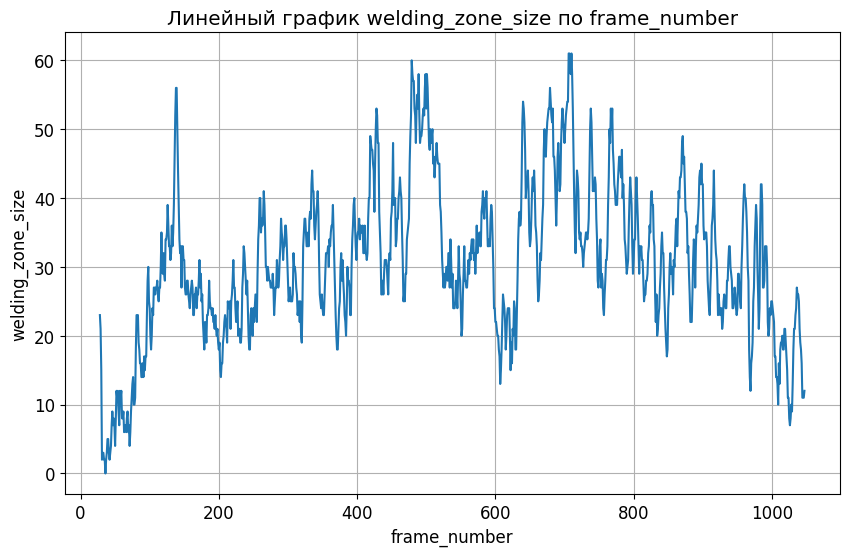

In [176]:
plt.figure(figsize=(10, 6))
plt.plot(df_Therm_7['frame_number'], df_Therm_7['spatters_total'])
plt.title('Линейный график welding_zone_size по frame_number')
plt.xlabel('frame_number')
plt.ylabel('welding_zone_size')
plt.grid(True)
plt.show()

## Нормализация количества кадров

In [177]:
def normalize_time_length(df, target_length=1500):
    """
    Нормализует временной ряд до target_length кадров.
    Удаляет thermogram_id, сохраняет бинарные признаки без изменений.
    """
    # Удаляем thermogram_id
    if 'thermogram_id' in df.columns:
        df = df.drop(columns=['thermogram_id','spatters_percentage_above_threshold'])

    # Сортируем по frame_number
    df = df.sort_values('frame_number').reset_index(drop=True)

    # Бинарные признаки (не изменяются)
    binary_cols = ['hu', 'hg', 'he', 'hp', 'hs', 'hm', 'hi']
    binary_values = {col: df[col].iloc[0] for col in binary_cols if col in df.columns}

    # Создаем новый DataFrame
    new_df = pd.DataFrame()
    new_df['frame_number'] = list(range(target_length))

    # Интерполируем числовые колонки (кроме frame_number и бинарных)
    original_time = np.linspace(0, 1, len(df))
    target_time = np.linspace(0, 1, target_length)

    numeric_cols = [col for col in df.columns
                   if col not in ['frame_number'] + binary_cols
                   and df[col].dtype in [np.float64, np.float32, np.int64, np.int32]]

    for col in numeric_cols:
        f = interp1d(original_time, df[col].values, kind='cubic', fill_value='extrapolate')
        new_df[col] = f(target_time)

    # Копируем бинарные признаки без изменений
    for col in binary_cols:
        if col in df.columns:
            new_df[col] = binary_values[col]

    # Обрабатываем нечисловые колонки (если остались)
    other_cols = [col for col in df.columns
                  if col not in ['frame_number'] + binary_cols + numeric_cols]

    for col in other_cols:
        indices = [int(i * (len(df)-1) / (target_length-1)) for i in range(target_length)]
        new_df[col] = df[col].iloc[indices].values

    return new_df

In [178]:
df_Normalize_Therm_7 = normalize_time_length(df_Therm_7, target_length=1500)

In [179]:
df_Normalize_Therm_7

,frame_number,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area,spatters_mean_temperature,...,spatters_max_temperature,spatters_above_threshold,spatters_total_pixels_above_threshold,hu,hg,he,hp,hs,hm,hi
0,0,17.000000,1906.588235,3778.000000,23.000000,0.000000,0.000000,1.598014,30.767448,425.526316,...,425.526316,1.000000,19.000000,1,1,1,1,1,1,1
1,1,17.568134,1539.191396,2536.229895,21.487506,0.057541,2.203811,1.481305,45.784135,395.952176,...,337.949855,1.446325,43.994200,1,1,1,1,1,1,1
2,2,14.155033,1590.401155,2645.392025,19.944012,-0.062687,1.925261,2.036175,14.255072,477.457465,...,561.052055,0.387896,18.954021,1,1,1,1,1,1,1
3,3,14.230789,1651.630947,3079.984890,14.511812,0.016692,5.414307,2.128246,26.584928,517.929132,...,678.053292,0.037974,0.062467,1,1,1,1,1,1,1
4,4,20.886352,1494.454810,3172.321727,4.783178,0.598216,13.383429,1.142858,115.363306,446.201718,...,485.604022,1.477638,20.510065,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,1495,17.275453,1094.790743,1240.394856,10.542710,1.683609,3.741310,1.921990,45.091996,457.029494,...,505.215349,3.499400,41.349482,1,1,1,1,1,1,1
1496,1496,12.178427,1091.385894,1199.621188,10.968689,2.973876,2.089506,2.388880,35.738326,450.300872,...,493.185994,4.011152,41.165494,1,1,1,1,1,1,1
1497,1497,11.897910,1087.559248,1188.872285,11.079748,2.567436,1.132517,2.101224,32.840096,449.257516,...,489.677612,3.350620,37.187317,1,1,1,1,1,1,1
1498,1498,13.790397,1082.495364,1195.141355,11.032486,1.594676,0.993890,1.594152,37.702438,449.409453,...,493.301388,3.005067,36.967421,1,1,1,1,1,1,1


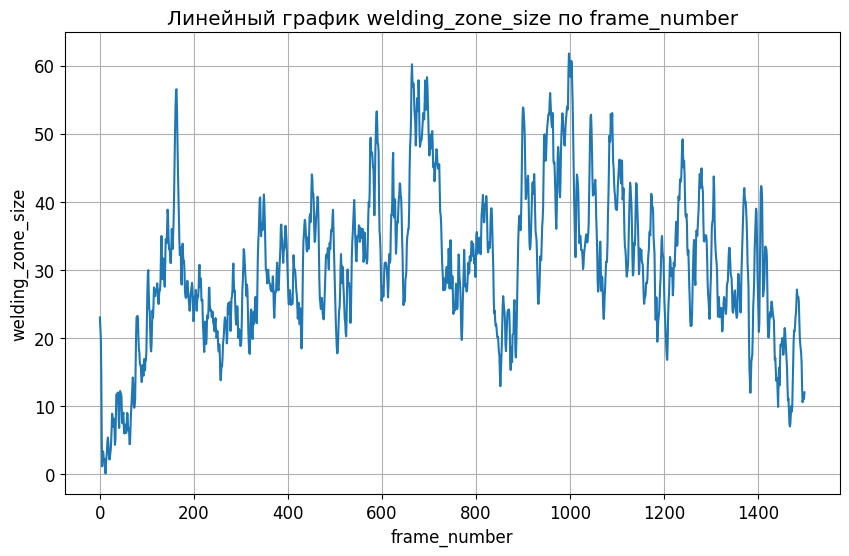

In [180]:
plt.figure(figsize=(10, 6))
plt.plot(df_Normalize_Therm_7['frame_number'], df_Normalize_Therm_7['spatters_total'])
plt.title('Линейный график welding_zone_size по frame_number')
plt.xlabel('frame_number')
plt.ylabel('welding_zone_size')
plt.grid(True)
plt.show()

In [181]:
def process_all_thermograms(input_dir, output_dir, target_length=1500):
    """
    Обрабатывает все CSV файлы в папке и нормализует их длину,
    добавляет столбец test_zone по четвертям и переставляет колонки.
    """
    
    # Создаем выходную папку, если её нет
    os.makedirs(output_dir, exist_ok=True)

    # Получаем список всех CSV файлов
    csv_files = [f for f in os.listdir(input_dir) if f.endswith('.csv')]

    print(f"Найдено {len(csv_files)} CSV файлов для обработки")
    print(f"Целевая длина: {target_length} кадров")
    print("-" * 60)

    # Счетчики для статистики
    stats = []

    # Обрабатываем каждый файл
    for i, filename in enumerate(csv_files, 1):
        try:
            # Формируем полные пути
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)

            # Читаем исходный файл
            df = pd.read_csv(input_path)

            # Выводим информацию о исходном файле
            orig_length = len(df)
            zones = df['test_zone'].unique() if 'test_zone' in df.columns else []

            print(f"[{i}/{len(csv_files)}] Обработка: {filename}")
            print(f"  Исходные: {orig_length} кадров, зоны: {zones}")

            # Нормализуем длину
            df_normalized = normalize_time_length(df, target_length=target_length)

            # Добавляем столбец test_zone по четвертям
            n = len(df_normalized)
            quartile = n // 4
            df_normalized['test_zone'] = (
                ['A'] * quartile +
                ['B'] * quartile +
                ['C'] * quartile +
                ['D'] * (n - 3 * quartile)
            )

            # Переставляем порядок колонок: test_zone, frame_number, остальные
            cols = ['test_zone', 'frame_number'] + [col for col in df_normalized.columns
                                                   if col not in ['test_zone', 'frame_number']]
            df_normalized = df_normalized[cols]

            # Выводим информацию о результате
            new_length = len(df_normalized)
            new_zones = df_normalized['test_zone'].unique() if 'test_zone' in df_normalized.columns else []

            print(f"  Результат: {new_length} кадров, зоны: {new_zones}")

            # Сохраняем нормализованный файл
            df_normalized.to_csv(output_path, index=False)

            # Сохраняем статистику
            stats.append({
                'filename': filename,
                'original_length': orig_length,
                'normalized_length': new_length,
                'original_zones': list(zones),
                'normalized_zones': list(new_zones),
                'success': True
            })

        except Exception as e:
            print(f"  ОШИБКА при обработке {filename}: {str(e)}")
            stats.append({
                'filename': filename,
                'error': str(e),
                'success': False
            })

        print("-" * 40)

    # Выводим итоговую статистику
    print("\n" + "="*60)
    print("ИТОГОВАЯ СТАТИСТИКА:")
    print("="*60)

    successful = [s for s in stats if s.get('success', False)]
    failed = [s for s in stats if not s.get('success', False)]

    print(f"Успешно обработано: {len(successful)} файлов")
    print(f"С ошибками: {len(failed)} файлов")

    if successful:
        print("\nСтатистика по успешно обработанным файлам:")
        orig_lengths = [s['original_length'] for s in successful]
        print(f"  Минимальная исходная длина: {min(orig_lengths)}")
        print(f"  Максимальная исходная длина: {max(orig_lengths)}")
        print(f"  Средняя исходная длина: {np.mean(orig_lengths):.1f}")
        print(f"  Медианная исходная длина: {np.median(orig_lengths)}")

    # Сохраняем статистику в CSV файл
    stats_df = pd.DataFrame(stats)
    stats_path = os.path.join(output_dir, "normalization_statistics.csv")
    stats_df.to_csv(stats_path, index=False)

    print(f"\nСтатистика сохранена в: {stats_path}")
    print(f"Все нормализованные файлы сохранены в: {output_dir}")

    return stats_df


## Нормализуем данные во всех термограммах

In [182]:
# Папки
input_directory = "thermograms_all_in_one"  # исходные данные
output_directory = "thermograms_all_in_one_normalized"  # нормализованные данные

# Целевая длина (как в вашем примере)
target_frames = 1500

# Обрабатываем все файлы
stats = process_all_thermograms(
    input_dir=input_directory,
    output_dir=output_directory,
    target_length=target_frames
)

Найдено 34 CSV файлов для обработки
Целевая длина: 1500 кадров
------------------------------------------------------------
[1/34] Обработка: thermogram_40.csv
  Исходные: 1486 кадров, зоны: []
  Результат: 1500 кадров, зоны: ['A' 'B' 'C' 'D']
----------------------------------------
[2/34] Обработка: thermogram_13.csv
  Исходные: 1381 кадров, зоны: []
  Результат: 1500 кадров, зоны: ['A' 'B' 'C' 'D']
----------------------------------------
[3/34] Обработка: thermogram_22.csv
  Исходные: 1485 кадров, зоны: []
  Результат: 1500 кадров, зоны: ['A' 'B' 'C' 'D']
----------------------------------------
[4/34] Обработка: thermogram_23.csv
  Исходные: 1238 кадров, зоны: []
  Результат: 1500 кадров, зоны: ['A' 'B' 'C' 'D']
----------------------------------------
[5/34] Обработка: thermogram_38.csv
  Исходные: 1734 кадров, зоны: []
  Результат: 1500 кадров, зоны: ['A' 'B' 'C' 'D']
----------------------------------------
[6/34] Обработка: thermogram_33.csv
  Исходные: 1309 кадров, зоны: []
 

In [183]:
df_therm_20_norm = pd.read_csv('thermograms_all_in_one_normalized/thermogram_20.csv')

In [184]:
df_therm_20_norm

,test_zone,frame_number,welding_zone_size,welding_zone_mean_temperature,welding_zone_max_temperature,spatters_total,spatters_new,spatters_lost,spatters_mean_velocity,spatters_mean_area,...,spatters_max_temperature,spatters_above_threshold,spatters_total_pixels_above_threshold,hu,hg,he,hp,hs,hm,hi
0,A,0,17.000000,2603.882353,4396.000000,6.000000,0.000000e+00,0.000000e+00,5.009986,12.811118,...,607.555556,2.000000e+00,34.000000,1,1,1,1,1,1,4
1,A,1,17.128813,2532.836556,4422.928650,6.047530,-3.573131e-04,-7.071189e-02,5.366154,13.190314,...,600.439601,3.083564e+00,59.995238,1,1,1,1,1,1,4
2,A,2,16.604603,2647.854518,4581.444116,5.210306,1.096786e-03,8.608528e-01,6.036615,13.180667,...,579.449155,2.029772e+00,41.964751,1,1,1,1,1,1,4
3,A,3,20.761506,2434.790085,4887.967559,4.134003,-4.633421e-03,1.147155e+00,5.681827,13.209612,...,595.913939,2.793218e+00,42.829563,1,1,1,1,1,1,4
4,A,4,23.329129,2334.250414,5070.886769,4.082238,1.873811e-02,2.826549e-01,5.691489,13.287922,...,610.883022,2.554861e+00,31.907136,1,1,1,1,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,D,1495,60.012834,1128.291643,1376.847719,0.000148,-2.132082e-08,-3.790723e-06,0.001192,0.004913,...,701.159187,1.056795e-05,0.000504,1,1,1,1,1,1,4
1496,D,1496,57.101879,1123.815374,1357.539018,-0.000037,5.272055e-09,9.373418e-07,-0.000295,-0.001215,...,701.160201,-2.613164e-06,-0.000125,1,1,1,1,1,1,4
1497,D,1497,53.244490,1120.757203,1336.086402,0.000009,-1.247958e-09,-2.218800e-07,0.000070,0.000288,...,701.159952,6.185672e-07,0.000030,1,1,1,1,1,1,4
1498,D,1498,49.781957,1118.063316,1316.311975,-0.000003,4.065622e-10,7.228448e-08,-0.000023,-0.000094,...,701.160016,-2.015180e-07,-0.000010,1,1,1,1,1,1,4


In [185]:
df_therm_20_norm.columns

Index(['test_zone', 'frame_number', 'welding_zone_size',
       'welding_zone_mean_temperature', 'welding_zone_max_temperature',
       'spatters_total', 'spatters_new', 'spatters_lost',
       'spatters_mean_velocity', 'spatters_mean_area',
       'spatters_mean_temperature', 'spatters_median_temperature',
       'spatters_max_temperature', 'spatters_above_threshold',
       'spatters_total_pixels_above_threshold', 'hu', 'hg', 'he', 'hp', 'hs',
       'hm', 'hi'],
      dtype='object')

Найдено 35 файлов для построения графиков
Будем строить графики для 13 признаков:
   1. welding_zone_size
   2. welding_zone_mean_temperature
   3. welding_zone_max_temperature
   4. spatters_total
   5. spatters_new
   6. spatters_lost
   7. spatters_mean_velocity
   8. spatters_mean_area
   9. spatters_mean_temperature
  10. spatters_median_temperature
  11. spatters_max_temperature
  12. spatters_above_threshold
  13. spatters_total_pixels_above_threshold

Построение графика для признака: welding_zone_size


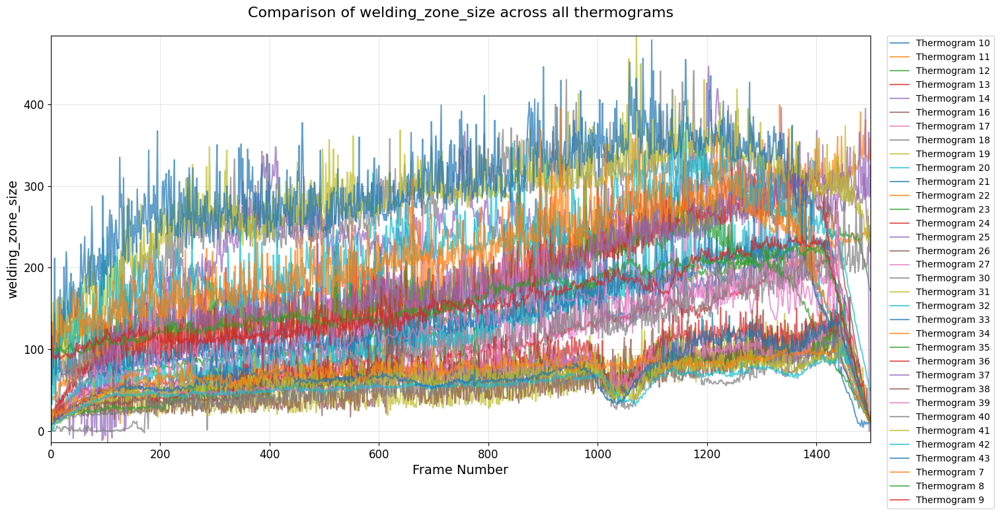


Построение графика для признака: welding_zone_mean_temperature


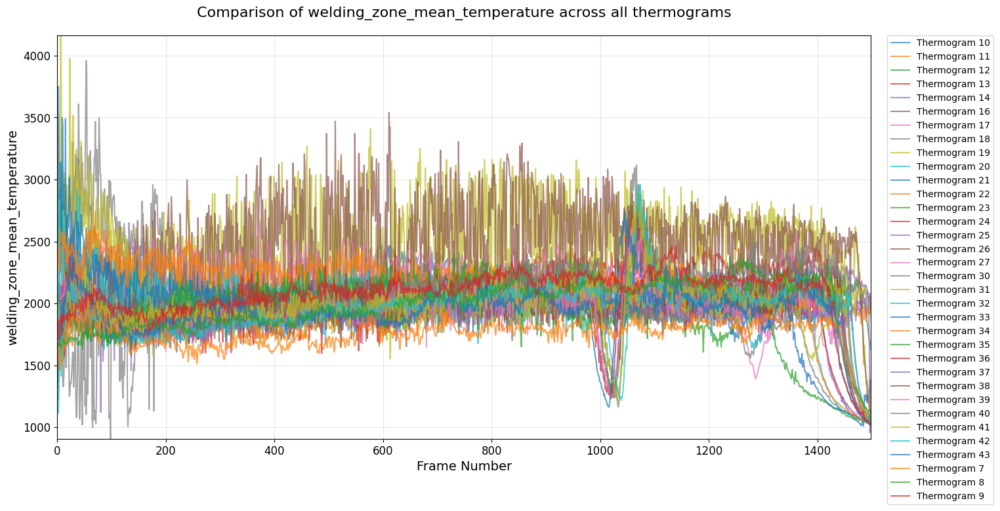


Построение графика для признака: welding_zone_max_temperature


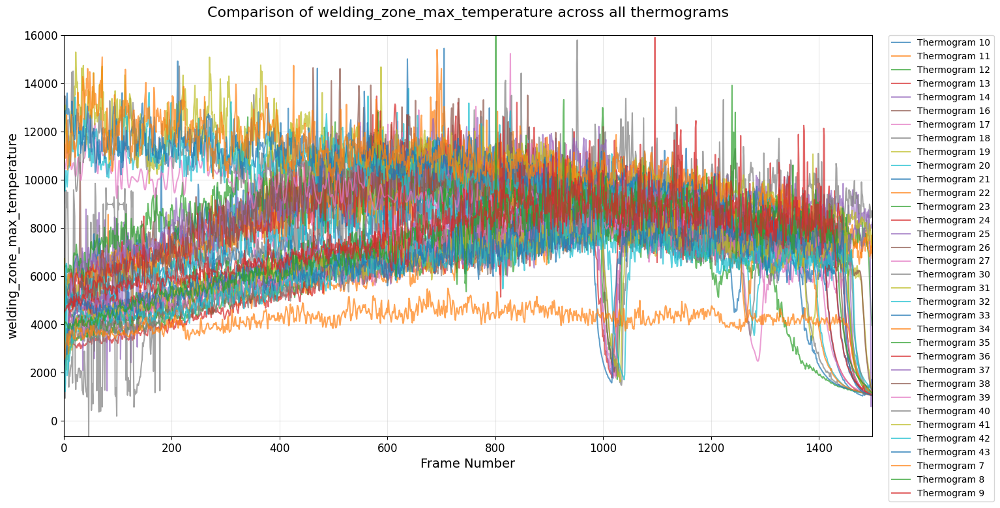


Построение графика для признака: spatters_total


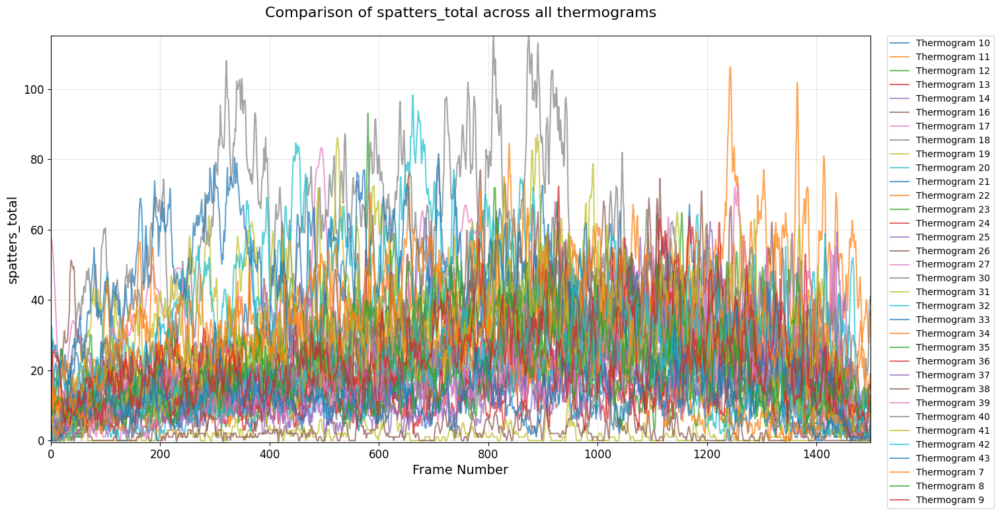


Построение графика для признака: spatters_new


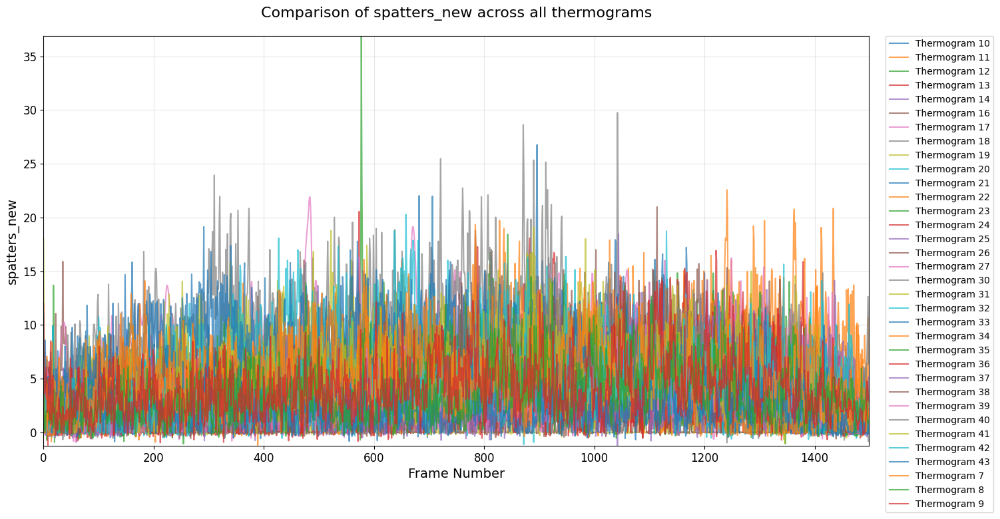


Построение графика для признака: spatters_lost


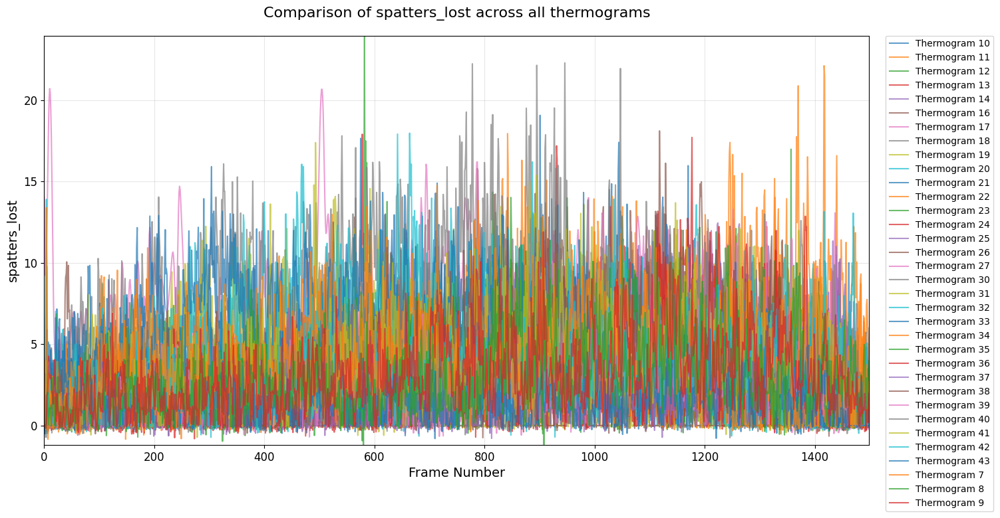


Построение графика для признака: spatters_mean_velocity


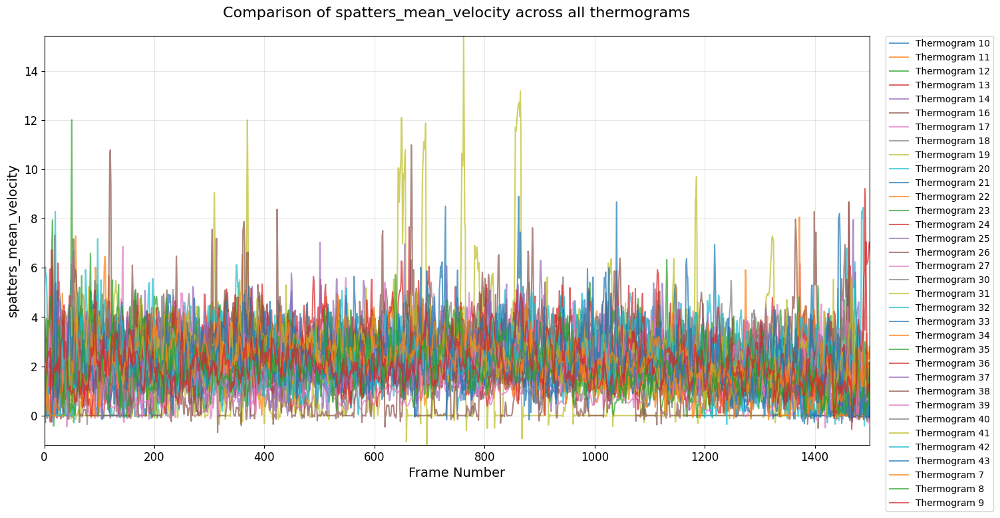


Построение графика для признака: spatters_mean_area


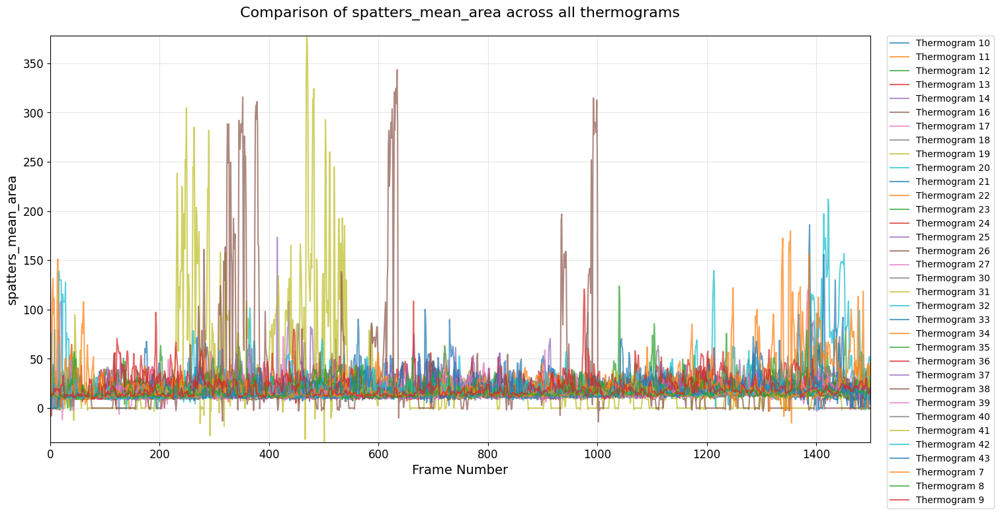


Построение графика для признака: spatters_mean_temperature


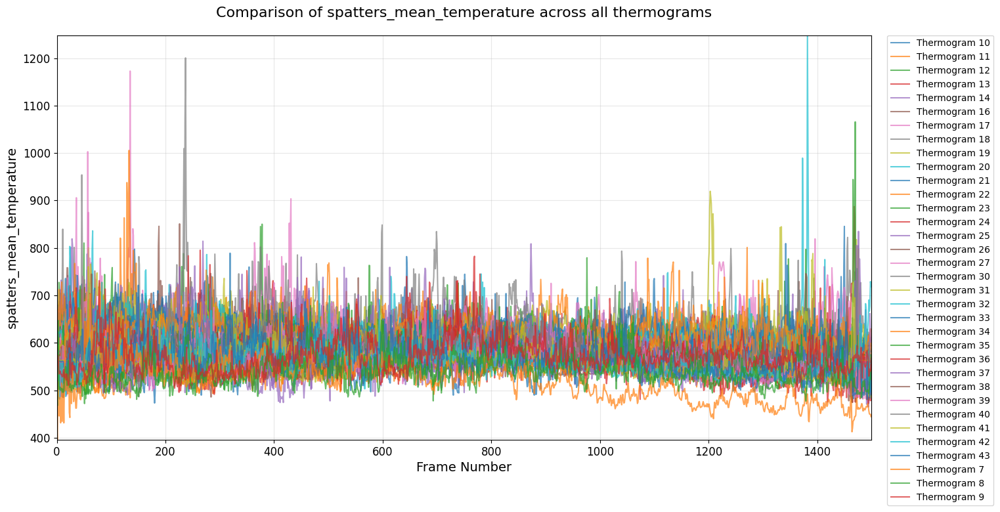


Построение графика для признака: spatters_median_temperature


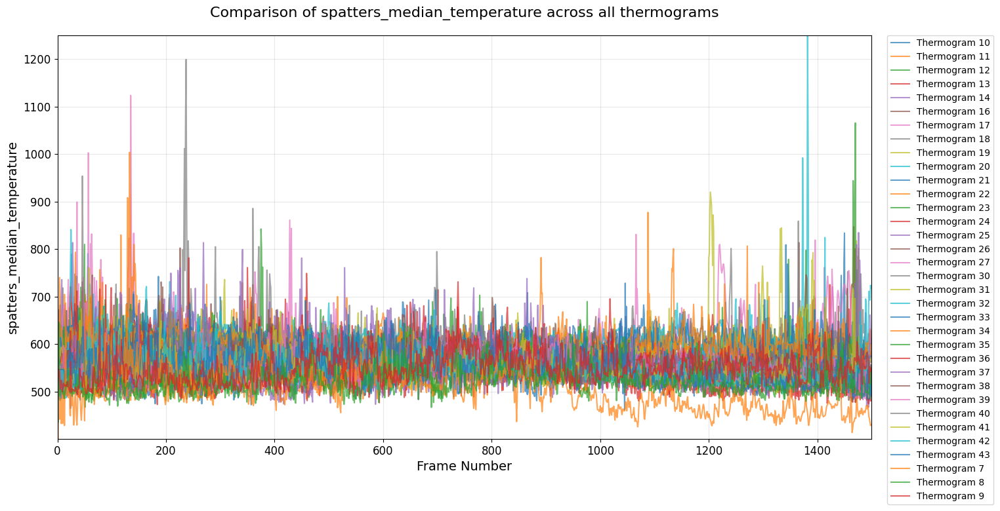


Построение графика для признака: spatters_max_temperature


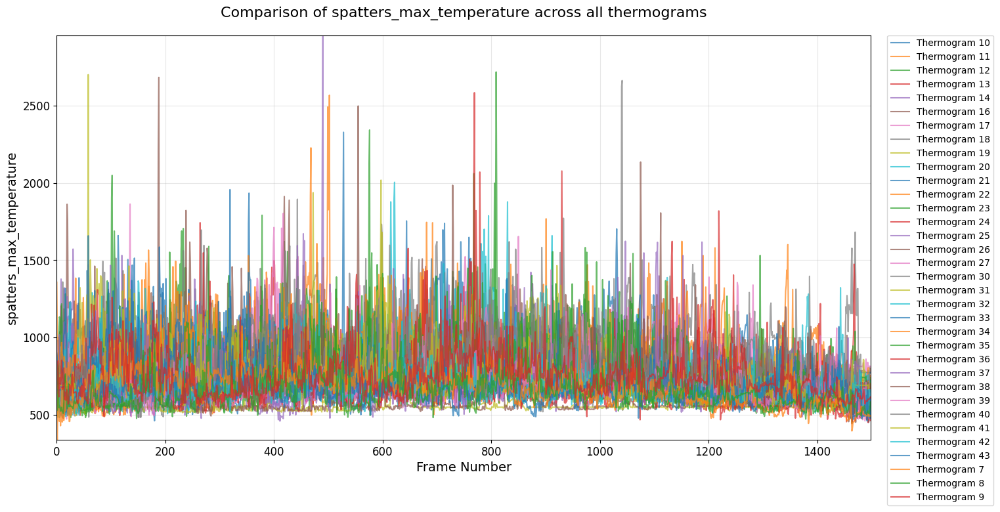


Построение графика для признака: spatters_above_threshold


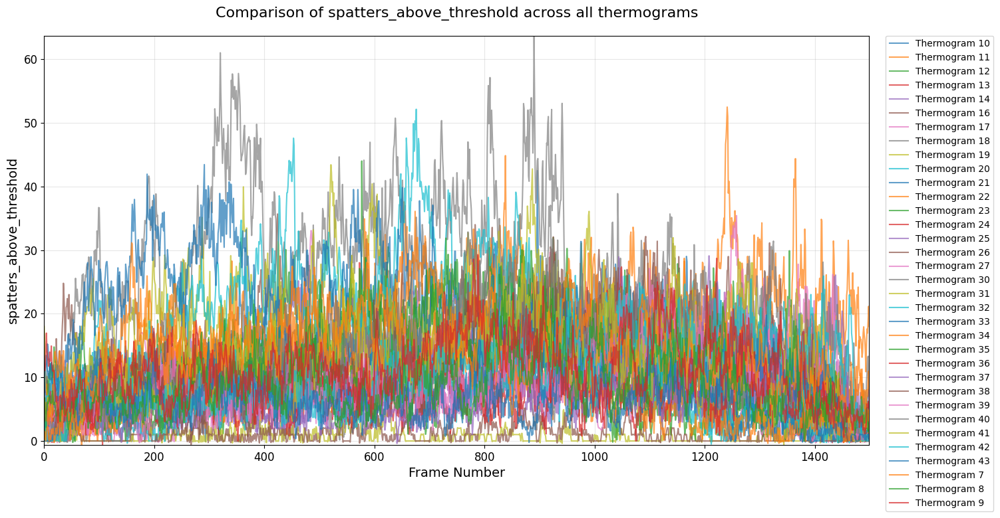


Построение графика для признака: spatters_total_pixels_above_threshold


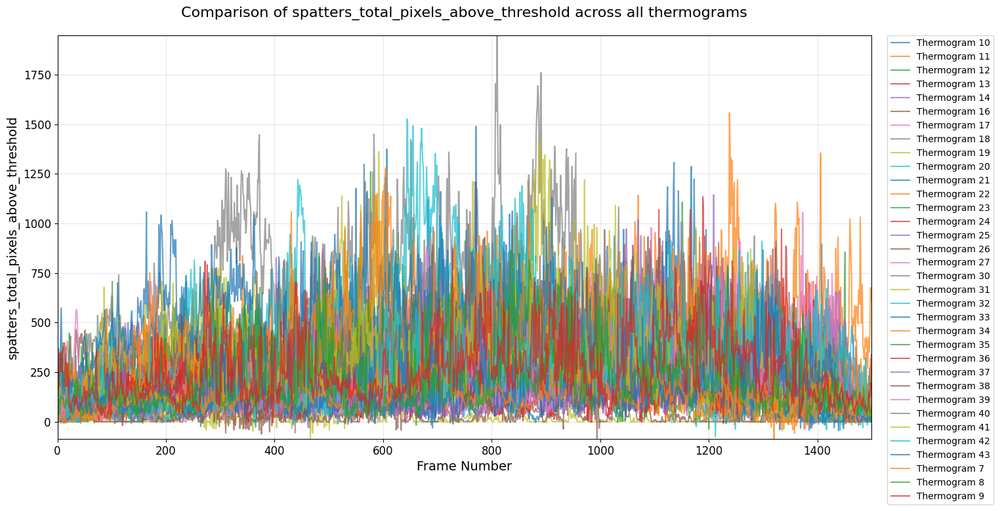


✅ Все графики построены и сохранены!


In [186]:
# Настройка стиля графиков
plt.style.use('default')
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 12

# Папка с данными
data_dir = "thermograms_all_in_one_normalized"

# Колонки которые НЕ нужно строить
exclude_columns = ['thermogram_id', 'hu', 'hg', 'he', 'hp', 'hs', 'hm', 'hi', 'test_zone']

# Получаем все файлы
csv_files = sorted([f for f in os.listdir(data_dir) if f.endswith('.csv')])

if not csv_files:
    print("❌ Нет CSV файлов в папке")
else:
    print(f"Найдено {len(csv_files)} файлов для построения графиков")
    
    # Загружаем первый файл для получения списка признаков
    first_file = csv_files[1]
    df_sample = pd.read_csv(os.path.join(data_dir, first_file))
    
    # Определяем признаки для построения (исключаем не нужные)
    features_to_plot = [col for col in df_sample.columns if col not in exclude_columns and col != 'frame_number']
    
    print(f"Будем строить графики для {len(features_to_plot)} признаков:")
    for i, feature in enumerate(features_to_plot, 1):
        print(f"  {i:2d}. {feature}")
    
    # Для каждого признака строим отдельный график
    for feature in features_to_plot:
        print(f"\n{'='*80}")
        print(f"Построение графика для признака: {feature}")
        print('='*80)
        
        fig, ax = plt.subplots(figsize=(16, 8))
        
        # Для каждой термограммы
        for i, filename in enumerate([f for f in csv_files if f.startswith('thermogram_')], 1):

            try:
                # Загружаем данные
                filepath = os.path.join(data_dir, filename)
                df = pd.read_csv(filepath)
                
                # Извлекаем номер термограммы из имени файла
                thermogram_num = filename.replace('thermogram_', '').replace('.csv', '')
                
                # Проверяем наличие признака
                if feature in df.columns:
                    # Сортируем по frame_number на всякий случай
                    df = df.sort_values('frame_number')
                    
                    # Строим график
                    ax.plot(df['frame_number'], df[feature], 
                           alpha=0.7, linewidth=1.5,
                           label=f'Thermogram {thermogram_num}')
                    
                else:
                    print(f"⚠ В файле {filename} нет признака {feature}")
                    
            except Exception as e:
                print(f"❌ Ошибка при обработке {filename}: {str(e)}")
        
        # Настройки графика
        ax.set_xlabel('Frame Number', fontsize=14)
        ax.set_ylabel(feature, fontsize=14)
        ax.set_title(f'Comparison of {feature} across all thermograms', fontsize=16, pad=20)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=10)
        
        # Автоматическое масштабирование осей
        ax.autoscale(enable=True, axis='both', tight=True)
        
        # Показываем график
        plt.show()
        
        # Очищаем фигуру для следующего графика
        plt.close(fig)

    print(f"\n{'='*80}")
    print("✅ Все графики построены и сохранены!")